In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
import sys
sys.path.append('../')

import torch
from fastai import *
from fastai.vision import *
from fastai.callbacks import *
from data.load import get_data, get_patched_data, get_patched_src, subsample
from data.utils import custom_cutout
from model.metrics import psnr, ssim
from model import losses

## Choose Devices

In [2]:
gpu_id = 3
num_cores = 4

In [3]:
torch.cuda.set_device(gpu_id)

To load the patch critic, loading data is necessary. Is there a way to load the model without loading any data (can we save a good critic not as .pth file but as something else)?

## SSIM Loss

In [4]:
ssim_logloss = losses.ssim_logloss

## Metrics

In [5]:
superres_metrics = [losses.mse_loss, psnr, ssim]

# Model

## Initialization

In [6]:
nb_name = 'ssimlogloss-resnet34-pretrained'
data_pth = Path('/home/alaa/Dropbox/BPHO Staff/USF/')
lr_path = f'EM/training/trainsets/lr/'
hr_path = f'EM/training/trainsets/hr/'
model_path = data_pth/f'EM/models/feat_loss/'

# loading 3 rounds of data
bs_1 = 64
size_1 = 128
db = get_data(data_pth=data_pth, lr_dir=lr_path, hr_dir=hr_path,
             bs=bs_1, in_sz=size_1, out_sz=size_1, max_zoom=6)

In [7]:
arch = models.resnet34
wd = 1e-3
learn = unet_learner(db, arch, wd=wd, 
                         loss_func=ssim_logloss,
                         metrics=superres_metrics, 
                         #callback_fns=LossMetrics, 
                         blur=False, 
                         norm_type=NormType.Weight, 
                         model_dir=model_path)
gc.collect()

0

In [8]:
learn.model_dir = model_path
print(learn.model_dir)

/home/alaa/Dropbox/BPHO Staff/USF/EM/models/feat_loss


## Load Model (optional)

In [9]:
# learn.model_dir = model_pth
# learn = learn.load(f'{nb_name}.3a')

# Load PSSR
learn = learn.load("emsynth_005_unet.5")

## Training

In [10]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


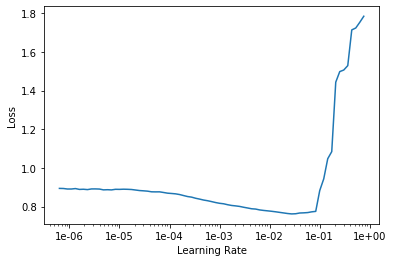

In [11]:
learn.recorder.plot()

### 1a

In [10]:
lr = 1e-3
learn.fit_one_cycle(1, max_lr=lr)
learn.save(f'{nb_name}.1a', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.595075,0.350910,0.036009,22.814219,0.704095,10:18


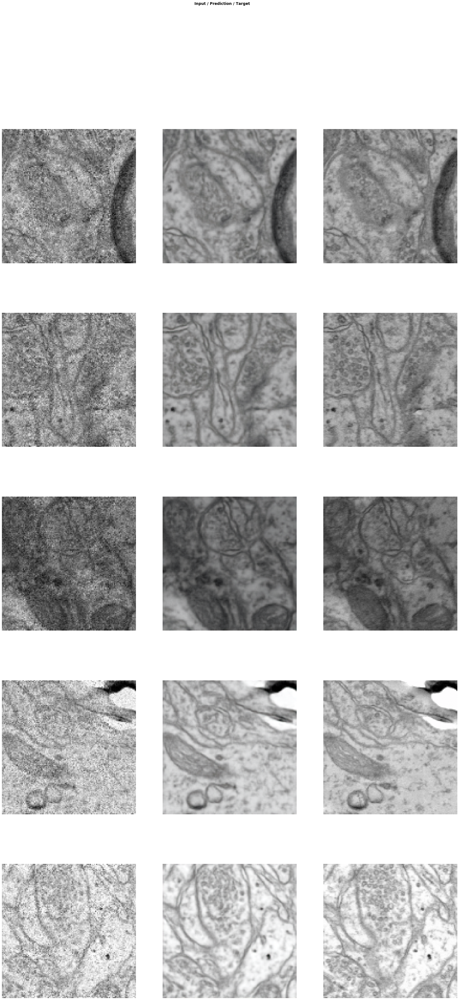

In [11]:
learn.show_results(rows=5, figsize=(30,60))

In [ ]:
len(learn.data.valid_dl)

### 1b

In [12]:
learn.unfreeze()

In [13]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


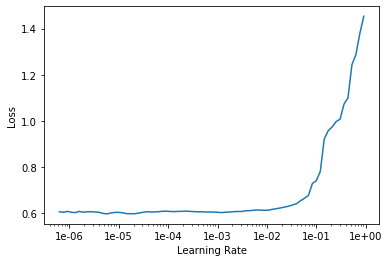

In [14]:
learn.recorder.plot()

In [15]:
lr = slice(1e-5, 1e-3)
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.1b', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.591819,0.349930,0.034321,23.023039,0.704785,10:29
1,0.593787,0.346670,0.036495,22.756002,0.707086,10:26
2,0.595095,0.344678,0.035399,22.888634,0.708496,10:38


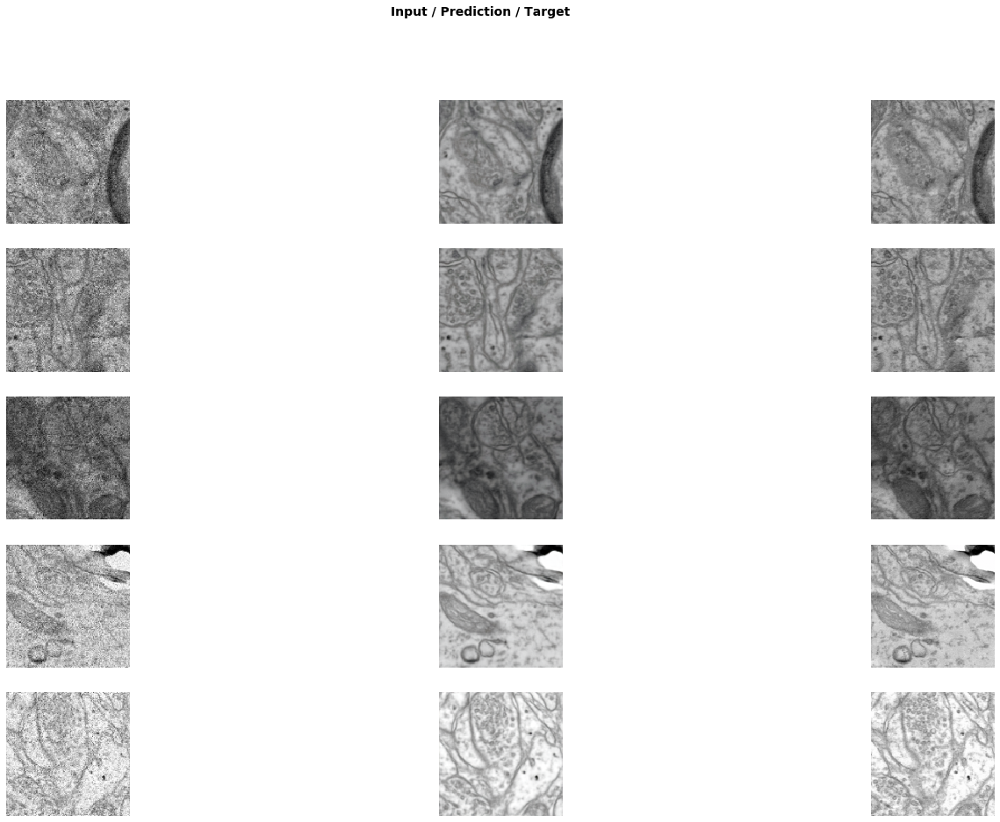

In [16]:
learn.show_results(rows=5, figsize=(25, 15))

## 2a

In [17]:
# Progressive resizing
bs_2 = 32
size_2 = 256
db = get_data(data_pth=data_pth, lr_dir=lr_path, hr_dir=hr_path,
             bs=bs_2, in_sz=size_2, out_sz=size_2, max_zoom=3)

In [18]:
learn.data = db

In [19]:
learn.freeze()

In [20]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


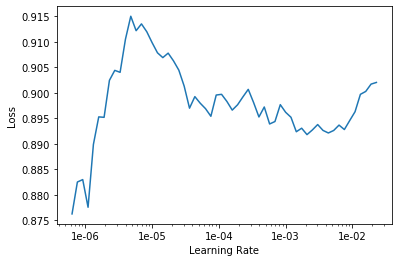

In [21]:
learn.recorder.plot()

In [22]:
lr = 1e-3
learn.fit_one_cycle(1, max_lr=lr)
learn.save(f'{nb_name}.2a', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.861839,0.630291,0.051475,21.264616,0.532598,24:23


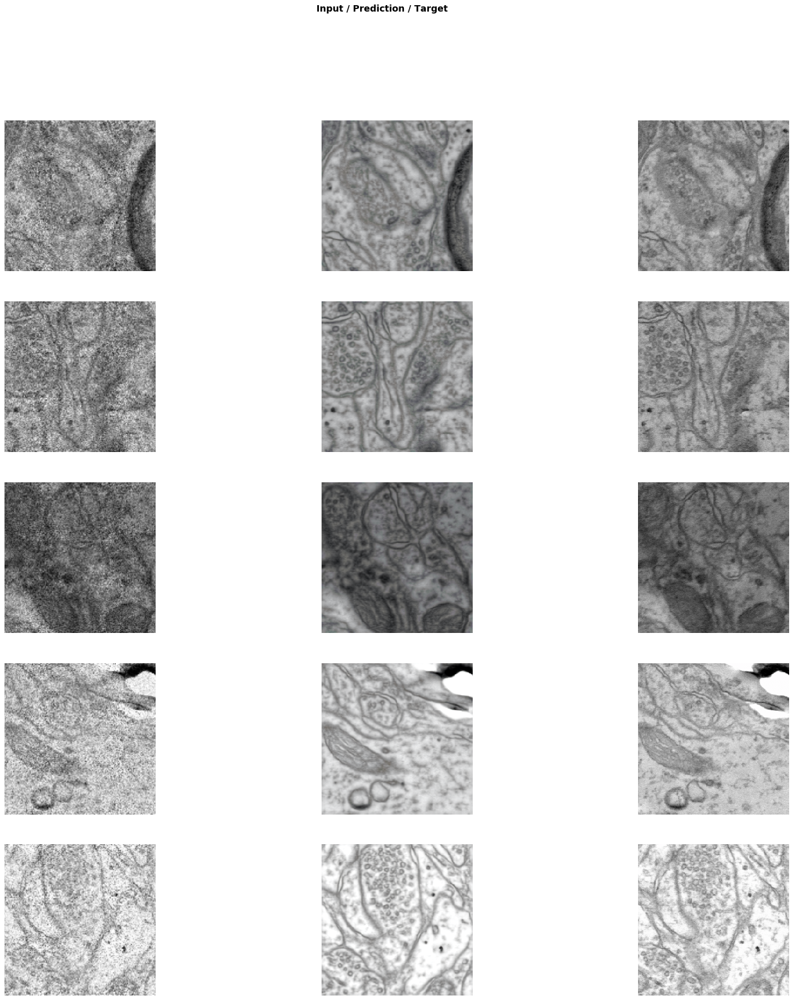

In [23]:
learn.show_results(rows=5, figsize=(25, 25))

## 2b

In [24]:
learn.unfreeze()

In [25]:
lr = slice(3e-6, 3e-5, 3e-4)
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.2b', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,0.863614,0.629994,0.051247,21.283966,0.532757,25:33
1,0.867510,0.629850,0.051195,21.288414,0.532833,25:37
2,0.860128,0.629630,0.051721,21.244005,0.532951,25:34


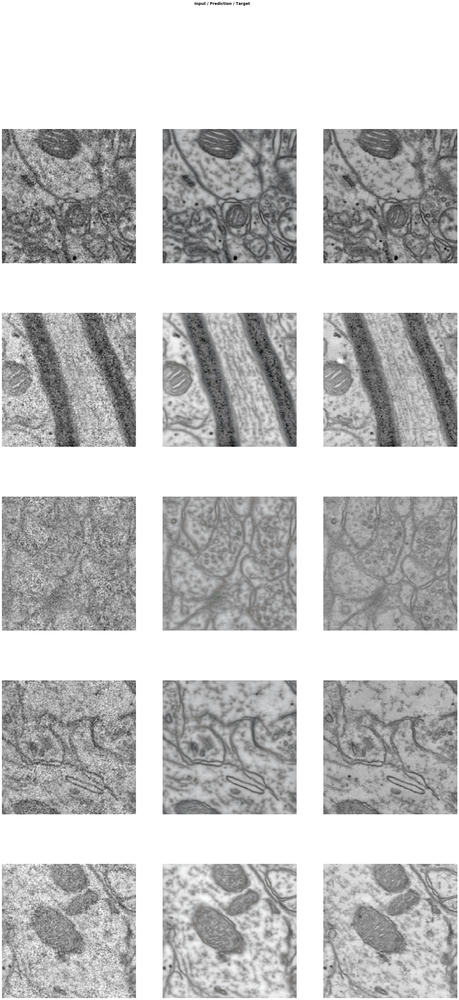

In [26]:
learn.show_results(5, figsize=(30,60))

## 3a

In [27]:
# loading 3 rounds of data
bs_3 = 8
size_3 = 512
db = get_data(data_pth=data_pth, lr_dir=lr_path, hr_dir=hr_path,
             bs=bs_3, in_sz=size_3, out_sz=size_3, max_zoom=2.)

In [28]:
learn.data = db
learn.data

ImageDataBunch;

Train: LabelList (79998 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: /home/alaa/Dropbox/BPHO Staff/USF/EM/training/trainsets/lr;

Valid: LabelList (19999 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: /home/alaa/Dropbox/BPHO Staff/USF/EM/training/trainsets/lr;

Test: None

In [29]:
learn.freeze()

In [30]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


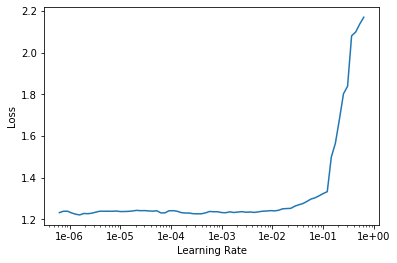

In [31]:
learn.recorder.plot()

In [32]:
lr = 3e-4
learn.fit_one_cycle(1, max_lr=lr)
learn.save(f'{nb_name}.3a', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,1.199703,1.085110,0.091022,18.720324,0.338904,1:41:49


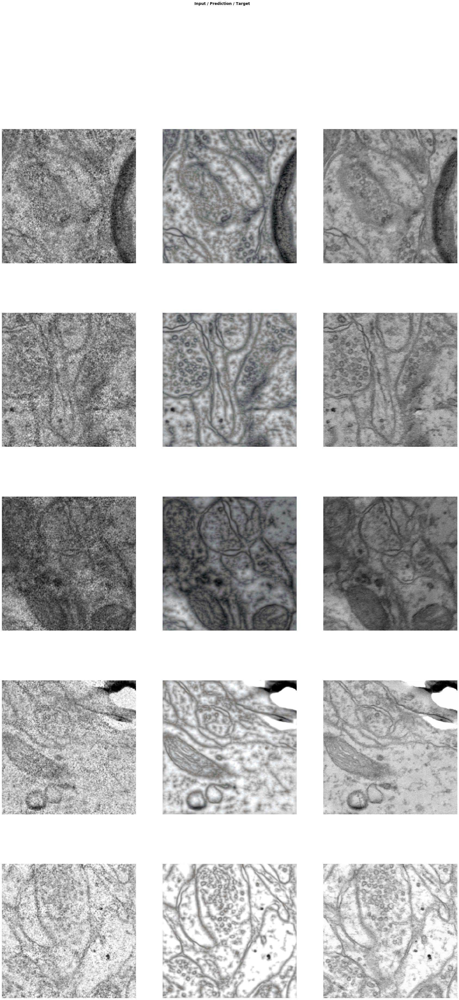

In [33]:
learn.show_results(rows=5, figsize=(30,60))

In [34]:
learn.unfreeze()

In [35]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


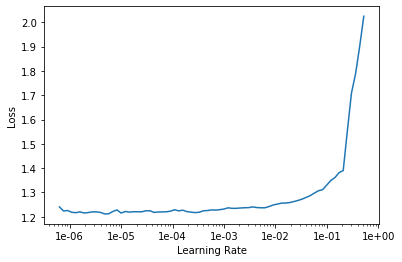

In [36]:
learn.recorder.plot()

In [37]:
lr = slice(1e-5, 1e-4, 1e-3)
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.3b', with_opt=False)

epoch,train_loss,valid_loss,mse_loss,psnr,ssim,time
0,1.194718,1.083993,0.089635,18.783686,0.339287,1:46:29
1,1.197270,1.082038,0.091241,18.708616,0.339940,1:46:40
2,1.197517,1.081413,0.089645,18.786009,0.340155,1:46:47


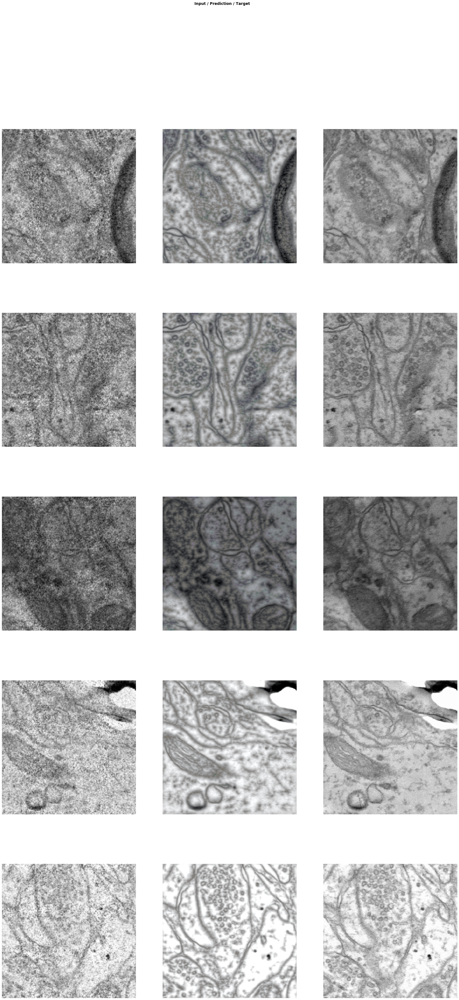

In [38]:
learn.show_results(rows=5, figsize=(30, 60))

In [ ]:
learn.load(f'{nb_name}.3b');